In [642]:
import pandas as pd
import matplotlib.pyplot as plt
df_with_inf = pd.read_csv("large-ds.csv")
print(df_with_inf.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2048 entries, 0 to 2047
Columns: 249 entries, Sample_Index to feat_movecap_per_used_sku
dtypes: bool(2), float64(236), int64(8), object(3)
memory usage: 3.9+ MB
None


In [643]:
# Replace True and False with arrows
ORDER_ATTRS = [
    "sum_rt", "order_size", "sum_cycle", "max_rt",
    "sku_rarity", "sku_contention", "sharing_degree", "min_copies",
]
BIN_ATTRS = ["rt", "p", "cycle", "demand_ratio", "copies", "demand"]
DIRECTIONS = [True, False]  # True = descending, False = ascending
# DESC_ARROW = "⬇"
# ASC_ARROW = "⬆"

from itertools import product



all_ama_configs = [f"AMA_{oa}_{od}_{ba}_{bd}_Score" for (oa, od, ba, bd) in product(ORDER_ATTRS, DIRECTIONS, BIN_ATTRS, DIRECTIONS)]
confs = all_ama_configs + ["AMA_Best_Score", "Baseline_Score"]
boolean_mask_matrix = df_with_inf[confs] > 1e9

row_has_inf = boolean_mask_matrix.any(axis=1)
print(row_has_inf.loc[row_has_inf])
inf_values = df_with_inf[row_has_inf]

df_unfiltered = df_with_inf.drop(inf_values.index)

# mapping = {True: DESC_ARROW, False: ASC_ARROW}
# df_unfiltered["AMA_Order_Dir"] = df_unfiltered.AMA_Order_Dir.map(mapping)
# df_unfiltered["AMA_Bin_Dir"] = df_unfiltered.AMA_Bin_Dir.map(mapping)

1540    True
1545    True
1547    True
1548    True
1554    True
1557    True
1558    True
1561    True
1566    True
1571    True
1576    True
1588    True
1599    True
dtype: bool


In [644]:
# We will try to find the most contentious instances
# 1. Where the difference between lowest and highest AMA score is the highest

df_unfiltered['AMA_Worst_Score'] = df_unfiltered[all_ama_configs].max(axis=1)
df_unfiltered['AMA_Worst_Config_Str'] = df_unfiltered[all_ama_configs].idxmin(axis=1)
# print(df['AMA_Worst_Score'].describe())
# print(df['AMA_Best_Score'].describe())
df_unfiltered['AMA_Score_Spread_Pct'] = (df_unfiltered["AMA_Worst_Score"] - df_unfiltered["AMA_Best_Score"]) / df_unfiltered["AMA_Best_Score"] 

print("--- Spread Pct Statistics ---")
print(df_unfiltered['AMA_Score_Spread_Pct'].describe())

# Let's use only the rows with above average percent spread
mean_spread = df_unfiltered['AMA_Score_Spread_Pct'].mean()
contentious_instances_df_spread = df_unfiltered[df_unfiltered['AMA_Score_Spread_Pct'] > mean_spread]

print(f"\nTotal instances: {len(df_unfiltered)}")
print(f"Contentious instances (above-average spread): {len(contentious_instances_df_spread)}")



# 2. Where the standard deviation of the AMA scores is the highest
df_unfiltered['AMA_Score_CV'] = df_unfiltered[all_ama_configs].std(axis=1) / df_unfiltered[all_ama_configs].mean(axis=1)

print("--- Coeff of Variation Statistics ---")
print(df_unfiltered['AMA_Score_CV'].describe())

mean_cv = df_unfiltered['AMA_Score_CV'].mean()

# Filter for instances that have an above-average standard deviation
contentious_instances_df_cv = df_unfiltered[df_unfiltered['AMA_Score_CV'] > mean_cv]

print(f"\nTotal instances: {len(df_unfiltered)}")
print(f"Contentious instances (above-average standard deviation): {len(contentious_instances_df_cv)}")



# 1. Calculate the 25th (Q1) and 75th (Q3) percentiles across the config columns
df_unfiltered['AMA_Score_Q1'] = df_unfiltered[all_ama_configs].quantile(0.25, axis=1)
df_unfiltered['AMA_Score_Q3'] = df_unfiltered[all_ama_configs].quantile(0.75, axis=1)
df_unfiltered['AMA_Score_Median'] = df_unfiltered[all_ama_configs].median(axis=1)

# 2. Calculate the absolute IQR and the Normalized IQR (scale-agnostic)
df_unfiltered['AMA_Score_IQR'] = df_unfiltered['AMA_Score_Q3'] - df_unfiltered['AMA_Score_Q1']

# Normalizing by the median gives you a relative spread, similar to your Spread Pct
df_unfiltered['AMA_Score_IQR_Pct'] = df_unfiltered['AMA_Score_IQR'] / df_unfiltered['AMA_Score_Median']

print("--- IQR Pct Statistics ---")
print(df_unfiltered['AMA_Score_IQR_Pct'].describe())

# 3. Filter for instances with above-average IQR Pct
mean_iqr_pct = df_unfiltered['AMA_Score_IQR_Pct'].mean()
contentious_instances_df_iqr = df_unfiltered[df_unfiltered['AMA_Score_IQR_Pct'] > mean_iqr_pct]

print(f"\nTotal instances: {len(df_unfiltered)}")
print(f"Contentious instances (above-average IQR Pct): {len(contentious_instances_df_iqr)}")




df_unfiltered["Contentious_Spread"] = df_unfiltered['AMA_Score_Spread_Pct'] > mean_spread
df_unfiltered["Contentious_CV"] = df_unfiltered['AMA_Score_CV'] > mean_cv 
df_unfiltered["Contentious_IQR"] = df_unfiltered['AMA_Score_IQR_Pct'] > mean_iqr_pct





--- Spread Pct Statistics ---
count    2035.000000
mean        0.341997
std         0.172913
min         0.000000
25%         0.219979
50%         0.311751
75%         0.409449
max         1.418103
Name: AMA_Score_Spread_Pct, dtype: float64

Total instances: 2035
Contentious instances (above-average spread): 833
--- Coeff of Variation Statistics ---
count    2035.000000
mean        0.060980
std         0.027974
min         0.000000
25%         0.042071
50%         0.055376
75%         0.069010
max         0.215601
Name: AMA_Score_CV, dtype: float64

Total instances: 2035
Contentious instances (above-average standard deviation): 820
--- IQR Pct Statistics ---
count    2035.000000
mean        0.085941
std         0.041834
min         0.000000
25%         0.060744
50%         0.076565
75%         0.095741
max         0.379121
Name: AMA_Score_IQR_Pct, dtype: float64

Total instances: 2035
Contentious instances (above-average IQR Pct): 750


In [645]:
import numpy as np

# 1. Sort the scores horizontally across the rows
# np.sort puts the smallest values first. 
# Index 0 is the best score, Index 1 is the second best.
sorted_scores = np.sort(df_unfiltered[all_ama_configs].values, axis=1)

# 2. Extract the second best score
df_unfiltered['AMA_Second_Best_Score'] = sorted_scores[:, 1]

# 3. Calculate the absolute 2-regret gap
# Since second best >= best, this will always be positive or zero
df_unfiltered['AMA_2_Regret_Gap'] = df_unfiltered['AMA_Second_Best_Score'] - df_unfiltered['AMA_Best_Score']

# 4. Calculate the normalized 2-regret gap (percentage relative to the best score)
df_unfiltered['AMA_2_Regret_Gap_Pct'] = df_unfiltered['AMA_2_Regret_Gap'] / df_unfiltered['AMA_Best_Score']

print("--- 2-Regret Gap Statistics ---")
print(df_unfiltered[['AMA_2_Regret_Gap', 'AMA_2_Regret_Gap_Pct']].describe())

--- 2-Regret Gap Statistics ---
       AMA_2_Regret_Gap  AMA_2_Regret_Gap_Pct
count       2035.000000           2035.000000
mean           6.269779              0.008027
std            9.541837              0.010331
min            0.000000              0.000000
25%            1.000000              0.001437
50%            3.000000              0.004695
75%            8.000000              0.010658
max          104.000000              0.104294


In [646]:
feature_cols = [x for x in df_unfiltered.columns if "feat_" in x]
print(feature_cols)
print(len(feature_cols))

['feat_num_stations', 'feat_num_lanes', 'feat_num_orders', 'feat_num_skus', 'feat_order_size_max', 'feat_order_size_min', 'feat_order_size_mean', 'feat_order_size_median', 'feat_order_size_cv', 'feat_order_times_max', 'feat_order_times_min', 'feat_order_times_mean', 'feat_order_times_median', 'feat_order_times_cv', 'feat_rt_min', 'feat_rt_mean', 'feat_rt_cv', 'feat_p_mean', 'feat_p_cv', 'feat_n_mean', 'feat_n_cv', 'feat_retrieval_picking_ratio', 'feat_used_skus_ratio', 'feat_sku_freq_min', 'feat_sku_freq_max', 'feat_sku_freq_mean', 'feat_sku_freq_cv', 'feat_avg_jaccard_weighted', 'feat_avg_jaccard_unweighted', 'feat_pareto_ratio_5', 'feat_pareto_ratio_10', 'feat_pareto_ratio_20', 'feat_pareto_ratio_30', 'feat_pareto_ratio_40', 'feat_pareto_ratio_50', 'feat_supply_demand_ratio_min', 'feat_supply_demand_ratio_mean', 'feat_supply_demand_ratio_median', 'feat_supply_demand_ratio_cv', 'feat_movecap', 'feat_movecap_per_lane', 'feat_movecap_per_used_sku']
42


In [647]:
# PRECOMPUTED (FOR GAP OF MEANS)
# results = [(0.03484716544605939, ['AMA_sku_contention_True_demand_True_Score']), (0.0204244768746244, ['AMA_sku_contention_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score']), (0.014512804110762821, ['AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score']), (0.011452144212878077, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score']), (0.009741816645226832, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score']), (0.008570781553863984, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score']), (0.00750386959861287, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.006639133956983259, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.005801946589033261, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.005166935534704552, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.004618771580453739, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.004210216674176425, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0038352800001882487, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.003563065702634065, ['AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0032324864184679106, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0029261869687333764, ['AMA_sum_rt_False_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0027072015389685996, ['AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.00247981155113197, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.002266429160082698, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.002075458923891771, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.001980674185635178, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0018564734941267779, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.00182145450216033, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0016524295009348073, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0015987337132522437, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0014834044997084205, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.001418969554489733, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0013652737668076013, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.00125928295112216, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0012186609204406398, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.001096794828396727, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.001096794828396727, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.000990337092817913, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.000990337092817913, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0008409227270933075, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0008409227270933075, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0007391341904434684, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0007391341904434684, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0007391341904434684, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0005990582225768126, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0005990582225768126, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0005990582225768126, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0005990582225768126, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00047205601171076825, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00047205601171076825, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00047205601171076825, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00047205601171076825, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00047205601171076825, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00035392527881016506, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00024513294376729577, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.00014054288776046067, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (3.875435111083771e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (8.641854783747961e-16, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score', 'AMA_min_copies_False_demand_False_Score'])]
# PRECOMPUTED (FOR MEAN OF GAPS) <== THIS IS WHAT WE USE IN THE WHOLE NOTEBOOK
results = [(0.059880861721497425, ['AMA_sum_cycle_True_cycle_False_Score']), (0.03879046995250035, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score']), (0.027551608000640382, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score']), (0.022515062652801454, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.01846015047897942, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.01626758672799733, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.01429273649134033, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_demand_True_Score']), (0.012775596995403093, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.011539940025886652, ['AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.010385638804194519, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.009408793745834032, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.00858234449842965, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.007870190727139015, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0072683855250861296, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.006719192844827582, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.006273316315432043, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.005855020599234262, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.005444451985386012, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.0050552444980478395, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.004719607828907568, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.004457067448168539, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']), (0.004217326618119133, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.003986452160534837, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0037619357117466556, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.003571896975090416, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0033970786108930007, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.003239035894181619, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.003088427630629109, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0029352095516874677, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0027871920500026626, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0026486435548445098, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0025156560870638334, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0023868187702111854, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0022657908026395557, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0021554475139462514, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0020404800238900123, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0019320284850012914, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.001825886675439703, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0017240420264788003, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0016249133976879993, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0015383388514607077, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0014507527840508239, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0013789794773466646, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0013101228327399017, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.001240648701037017, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0011755211217729933, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0011158773489838847, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.001058081511934983, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0010056532273079455, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0009577135379581492, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0009108804157149653, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0008657963660174683, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0008256715661658642, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0007874259828157815, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score']), (0.0007507011666296748, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.0007147796844795273, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.0006848015416249797, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score']), (0.0006536982483829057, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0006240569379964978, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0005944117030851626, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0005691527051290279, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0005436367066062875, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.000520855798377795, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0004926604384605238, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00046784128934729274, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00044468986781787123, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00042273228147715614, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0004032671650850972, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0003832273155115473, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0003647878749071243, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0003471432585666623, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00033011190334364393, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00031143072276362815, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0002952224733310249, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0002784590525866104, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0002640321214473218, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00024853054510454164, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0002342081169890431, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00022063922835569016, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00020753042697463364, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00019419862440739344, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00018133822199550842, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00016872854652438818, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00015758730724124703, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00014742231968689623, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00013577243976148345, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.0001287324919270194, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00012051400642953958, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00011139834301299167, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (0.00010314994912596909, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.630900331636383e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (8.801309499140153e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (8.115634394867399e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (7.459704929146938e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.755020712301274e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.245797405157738e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (5.7818141085519414e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (5.320405196451716e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (4.895225399059733e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (4.435972603356042e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (3.918075356623696e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (3.50743427746103e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (3.168882347770463e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.829517367519685e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.4906204769026274e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.16518968789714e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.8726893953990853e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.5934845707388234e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.3971852492744574e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1286603905924508e-05, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (8.990339927406055e-06, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.756701329990733e-06, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (5.0385177936540515e-06, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (3.3498563112299706e-06, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.657501677687634e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.299855261123085e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.3248542860555546e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.825007026201035e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.423536036415101e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.3248542860555546e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score']), (1.6173545787090404e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (9.750009950515448e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (3.138339085051456e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.5512417238804375e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (2.5512417238804375e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (1.1291871957475053e-06, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.530239289315176e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.530239289315176e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.530239289315176e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.530239289315176e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_demand_True_Score']), (6.530239289315176e-07, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score']), (2.020605904817785e-14, ['AMA_sum_rt_True_rt_True_Score', 'AMA_sum_rt_True_rt_False_Score', 'AMA_sum_rt_True_p_True_Score', 'AMA_sum_rt_True_p_False_Score', 'AMA_sum_rt_True_cycle_True_Score', 'AMA_sum_rt_True_cycle_False_Score', 'AMA_sum_rt_True_demand_ratio_True_Score', 'AMA_sum_rt_True_demand_ratio_False_Score', 'AMA_sum_rt_True_copies_True_Score', 'AMA_sum_rt_True_copies_False_Score', 'AMA_sum_rt_True_demand_True_Score', 'AMA_sum_rt_True_demand_False_Score', 'AMA_sum_rt_False_rt_True_Score', 'AMA_sum_rt_False_rt_False_Score', 'AMA_sum_rt_False_p_True_Score', 'AMA_sum_rt_False_p_False_Score', 'AMA_sum_rt_False_cycle_True_Score', 'AMA_sum_rt_False_cycle_False_Score', 'AMA_sum_rt_False_demand_ratio_True_Score', 'AMA_sum_rt_False_demand_ratio_False_Score', 'AMA_sum_rt_False_copies_True_Score', 'AMA_sum_rt_False_copies_False_Score', 'AMA_sum_rt_False_demand_True_Score', 'AMA_sum_rt_False_demand_False_Score', 'AMA_order_size_True_rt_True_Score', 'AMA_order_size_True_rt_False_Score', 'AMA_order_size_True_p_True_Score', 'AMA_order_size_True_p_False_Score', 'AMA_order_size_True_cycle_True_Score', 'AMA_order_size_True_cycle_False_Score', 'AMA_order_size_True_demand_ratio_True_Score', 'AMA_order_size_True_demand_ratio_False_Score', 'AMA_order_size_True_copies_True_Score', 'AMA_order_size_True_copies_False_Score', 'AMA_order_size_True_demand_True_Score', 'AMA_order_size_True_demand_False_Score', 'AMA_order_size_False_rt_True_Score', 'AMA_order_size_False_rt_False_Score', 'AMA_order_size_False_p_True_Score', 'AMA_order_size_False_p_False_Score', 'AMA_order_size_False_cycle_True_Score', 'AMA_order_size_False_cycle_False_Score', 'AMA_order_size_False_demand_ratio_True_Score', 'AMA_order_size_False_demand_ratio_False_Score', 'AMA_order_size_False_copies_True_Score', 'AMA_order_size_False_copies_False_Score', 'AMA_order_size_False_demand_True_Score', 'AMA_order_size_False_demand_False_Score', 'AMA_sum_cycle_True_rt_True_Score', 'AMA_sum_cycle_True_rt_False_Score', 'AMA_sum_cycle_True_p_True_Score', 'AMA_sum_cycle_True_p_False_Score', 'AMA_sum_cycle_True_cycle_True_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_sum_cycle_True_demand_ratio_True_Score', 'AMA_sum_cycle_True_demand_ratio_False_Score', 'AMA_sum_cycle_True_copies_True_Score', 'AMA_sum_cycle_True_copies_False_Score', 'AMA_sum_cycle_True_demand_True_Score', 'AMA_sum_cycle_True_demand_False_Score', 'AMA_sum_cycle_False_rt_True_Score', 'AMA_sum_cycle_False_rt_False_Score', 'AMA_sum_cycle_False_p_True_Score', 'AMA_sum_cycle_False_p_False_Score', 'AMA_sum_cycle_False_cycle_True_Score', 'AMA_sum_cycle_False_cycle_False_Score', 'AMA_sum_cycle_False_demand_ratio_True_Score', 'AMA_sum_cycle_False_demand_ratio_False_Score', 'AMA_sum_cycle_False_copies_True_Score', 'AMA_sum_cycle_False_copies_False_Score', 'AMA_sum_cycle_False_demand_True_Score', 'AMA_sum_cycle_False_demand_False_Score', 'AMA_max_rt_True_rt_True_Score', 'AMA_max_rt_True_rt_False_Score', 'AMA_max_rt_True_p_True_Score', 'AMA_max_rt_True_p_False_Score', 'AMA_max_rt_True_cycle_True_Score', 'AMA_max_rt_True_cycle_False_Score', 'AMA_max_rt_True_demand_ratio_True_Score', 'AMA_max_rt_True_demand_ratio_False_Score', 'AMA_max_rt_True_copies_True_Score', 'AMA_max_rt_True_copies_False_Score', 'AMA_max_rt_True_demand_True_Score', 'AMA_max_rt_True_demand_False_Score', 'AMA_max_rt_False_rt_True_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_p_True_Score', 'AMA_max_rt_False_p_False_Score', 'AMA_max_rt_False_cycle_True_Score', 'AMA_max_rt_False_cycle_False_Score', 'AMA_max_rt_False_demand_ratio_True_Score', 'AMA_max_rt_False_demand_ratio_False_Score', 'AMA_max_rt_False_copies_True_Score', 'AMA_max_rt_False_copies_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_max_rt_False_demand_False_Score', 'AMA_sku_rarity_True_rt_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_rarity_True_p_True_Score', 'AMA_sku_rarity_True_p_False_Score', 'AMA_sku_rarity_True_cycle_True_Score', 'AMA_sku_rarity_True_cycle_False_Score', 'AMA_sku_rarity_True_demand_ratio_True_Score', 'AMA_sku_rarity_True_demand_ratio_False_Score', 'AMA_sku_rarity_True_copies_True_Score', 'AMA_sku_rarity_True_copies_False_Score', 'AMA_sku_rarity_True_demand_True_Score', 'AMA_sku_rarity_True_demand_False_Score', 'AMA_sku_rarity_False_rt_True_Score', 'AMA_sku_rarity_False_rt_False_Score', 'AMA_sku_rarity_False_p_True_Score', 'AMA_sku_rarity_False_p_False_Score', 'AMA_sku_rarity_False_cycle_True_Score', 'AMA_sku_rarity_False_cycle_False_Score', 'AMA_sku_rarity_False_demand_ratio_True_Score', 'AMA_sku_rarity_False_demand_ratio_False_Score', 'AMA_sku_rarity_False_copies_True_Score', 'AMA_sku_rarity_False_copies_False_Score', 'AMA_sku_rarity_False_demand_True_Score', 'AMA_sku_rarity_False_demand_False_Score', 'AMA_sku_contention_True_rt_True_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_p_True_Score', 'AMA_sku_contention_True_p_False_Score', 'AMA_sku_contention_True_cycle_True_Score', 'AMA_sku_contention_True_cycle_False_Score', 'AMA_sku_contention_True_demand_ratio_True_Score', 'AMA_sku_contention_True_demand_ratio_False_Score', 'AMA_sku_contention_True_copies_True_Score', 'AMA_sku_contention_True_copies_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sku_contention_True_demand_False_Score', 'AMA_sku_contention_False_rt_True_Score', 'AMA_sku_contention_False_rt_False_Score', 'AMA_sku_contention_False_p_True_Score', 'AMA_sku_contention_False_p_False_Score', 'AMA_sku_contention_False_cycle_True_Score', 'AMA_sku_contention_False_cycle_False_Score', 'AMA_sku_contention_False_demand_ratio_True_Score', 'AMA_sku_contention_False_demand_ratio_False_Score', 'AMA_sku_contention_False_copies_True_Score', 'AMA_sku_contention_False_copies_False_Score', 'AMA_sku_contention_False_demand_True_Score', 'AMA_sku_contention_False_demand_False_Score', 'AMA_sharing_degree_True_rt_True_Score', 'AMA_sharing_degree_True_rt_False_Score', 'AMA_sharing_degree_True_p_True_Score', 'AMA_sharing_degree_True_p_False_Score', 'AMA_sharing_degree_True_cycle_True_Score', 'AMA_sharing_degree_True_cycle_False_Score', 'AMA_sharing_degree_True_demand_ratio_True_Score', 'AMA_sharing_degree_True_demand_ratio_False_Score', 'AMA_sharing_degree_True_copies_True_Score', 'AMA_sharing_degree_True_copies_False_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_sharing_degree_True_demand_False_Score', 'AMA_sharing_degree_False_rt_True_Score', 'AMA_sharing_degree_False_rt_False_Score', 'AMA_sharing_degree_False_p_True_Score', 'AMA_sharing_degree_False_p_False_Score', 'AMA_sharing_degree_False_cycle_True_Score', 'AMA_sharing_degree_False_cycle_False_Score', 'AMA_sharing_degree_False_demand_ratio_True_Score', 'AMA_sharing_degree_False_demand_ratio_False_Score', 'AMA_sharing_degree_False_copies_True_Score', 'AMA_sharing_degree_False_copies_False_Score', 'AMA_sharing_degree_False_demand_True_Score', 'AMA_sharing_degree_False_demand_False_Score', 'AMA_min_copies_True_rt_True_Score', 'AMA_min_copies_True_rt_False_Score', 'AMA_min_copies_True_p_True_Score', 'AMA_min_copies_True_p_False_Score', 'AMA_min_copies_True_cycle_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_ratio_True_Score', 'AMA_min_copies_True_demand_ratio_False_Score', 'AMA_min_copies_True_copies_True_Score', 'AMA_min_copies_True_copies_False_Score', 'AMA_min_copies_True_demand_True_Score', 'AMA_min_copies_True_demand_False_Score', 'AMA_min_copies_False_rt_True_Score', 'AMA_min_copies_False_rt_False_Score', 'AMA_min_copies_False_p_True_Score', 'AMA_min_copies_False_p_False_Score', 'AMA_min_copies_False_cycle_True_Score', 'AMA_min_copies_False_cycle_False_Score', 'AMA_min_copies_False_demand_ratio_True_Score', 'AMA_min_copies_False_demand_ratio_False_Score', 'AMA_min_copies_False_copies_True_Score', 'AMA_min_copies_False_copies_False_Score', 'AMA_min_copies_False_demand_True_Score', 'AMA_min_copies_False_demand_False_Score'])]


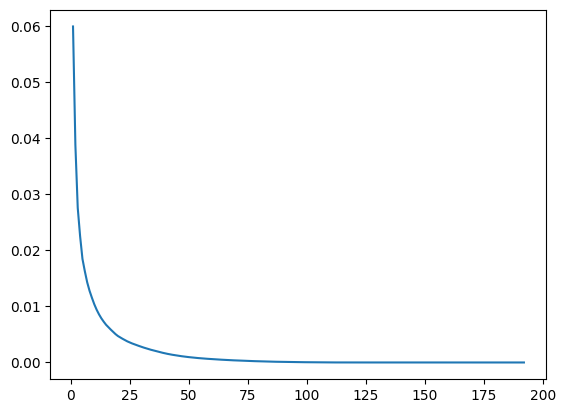

In [648]:
import gurobipy as gb
import numpy as np

def get_pareto_warmstart(df, all_ama_configs):
    m = gb.Model("Pareto_Warmstart_Relative")
    # Force Gurobi to find the absolute mathematical optimum, ignoring defaults
    m.Params.MIPGap = 0.0
    m.Params.OutputFlag = 0
    
    # 1. Calculate the relative performance matrix
    P_abs = df[all_ama_configs].values
    baseline = df["AMA_Best_Score"].values
    
    # Divide each row by its corresponding baseline value
    # P_relative[i,j] = 1.05 means config j is 5% slower than the best possible for row i
    P_relative = P_abs / baseline[:, None]
    num_rows, num_configs = P_relative.shape
    
    # 2. Define Variables
    S = m.addVars(num_configs, vtype=gb.GRB.BINARY, name="use_config")
    X = m.addVars(num_rows, num_configs, vtype=gb.GRB.BINARY, name="assign")

    # 3. Define Constraints
    # We use <= k so Gurobi can reuse the search tree from the previous step
    k_constr = m.addConstr(S.sum() == 1, name="k_configs")
    
    m.addConstrs((gb.quicksum(X[i, j] for j in range(num_configs)) == 1 
                  for i in range(num_rows)), name="assign_one")
    m.addConstrs((X[i, j] <= S[j] 
                  for i in range(num_rows) for j in range(num_configs)), name="link")

    # 4. Define Objective (Minimize the mean of the ratios)
    m.setObjective(
        gb.quicksum(P_relative[i, j] * X[i, j] for i in range(num_rows) for j in range(num_configs)) / num_rows, 
        sense=gb.GRB.MINIMIZE
    )

    results = []
    
    # 5. Iteratively loosen k and solve
    for k in range(1, num_configs + 1):
        k_constr.RHS = k
        m.optimize()
        
        if m.Status == gb.GRB.OPTIMAL:
            # m.ObjVal is the mean ratio (e.g., 1.052). 
            # Subtract 1.0 to get the mean relative gap (e.g., 0.052 or 5.2%)
            mean_gap = m.ObjVal - 1.0
            configs = [all_ama_configs[j] for j in range(num_configs) if S[j].x > 0.5]
            results.append((mean_gap, configs))
        else:
            print(f"Failed at k={k} with status {m.Status}")
            break
            
    return results

ks = list(range(1,193))
# results = get_pareto_warmstart(df_unfiltered, all_ama_configs)

plt.plot(ks, [x[0] for x in results])
plt.show()

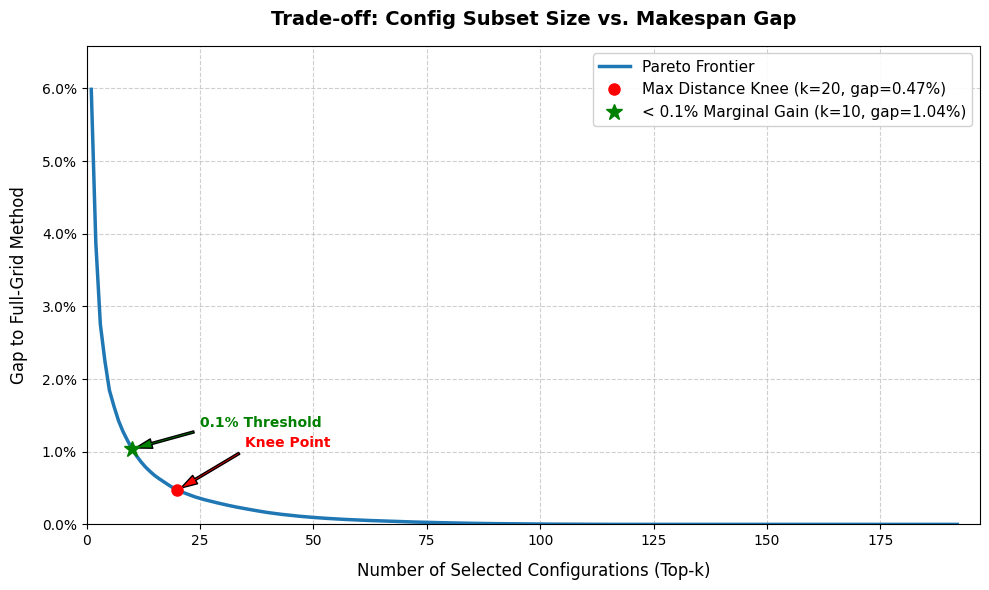

In [649]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# Extract gaps from your results
gaps = [x[0] for x in results]

# 1. Convert to numpy arrays for vectorized math
x = np.array(ks)
y = np.array(gaps)

# 2. Calculate the "Knee" (Maximum Distance Method)
# Normalize axes to [0, 1] so the geometric distance isn't skewed by scale differences
x_norm = (x - x.min()) / (x.max() - x.min())
y_norm = (y - y.min()) / (y.max() - y.min())

# Define the line connecting the first and last point
p1 = np.array([x_norm[0], y_norm[0]])
p2 = np.array([x_norm[-1], y_norm[-1]])

# Calculate perpendicular distance from every point to that line
# Formula: cross product of the line vector and point vector, divided by line length
line_vec = p2 - p1
distances = np.cross(line_vec, p1 - np.column_stack((x_norm, y_norm))) / np.linalg.norm(line_vec)

# The knee is the point with the maximum absolute distance
knee_idx = np.argmax(np.abs(distances))
knee_k = x[knee_idx]
knee_gap = y[knee_idx]

# 3. Calculate the Marginal Gain Threshold (< 0.1% improvement)
# Find the first index where the drop to the next point is less than 0.001
threshold_idx = len(y) - 1  # Default to last if never met
for i in range(len(y) - 1):
    if (y[i] - y[i+1]) < 0.001:
        threshold_idx = i
        break
        
thresh_k = x[threshold_idx]
thresh_gap = y[threshold_idx]

# 4. Prettify the Plot
plt.figure(figsize=(10, 6))

# Plot the main Pareto frontier
plt.plot(x, y, linewidth=2.5, color="#1f77b4", label="Pareto Frontier")

# Plot and annotate the Knee
plt.plot(knee_k, knee_gap, 'ro', markersize=8, zorder=5,
         label=f"Max Distance Knee (k={knee_k}, gap={knee_gap:.2%})")
plt.annotate("Knee Point", 
             xy=(knee_k, knee_gap), 
             xytext=(knee_k + 15, knee_gap + np.max(y)*0.10),
             fontsize=10, fontweight='bold', color='red',
             arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=7))

# Plot and annotate the 0.1% Threshold
plt.plot(thresh_k, thresh_gap, 'g*', markersize=12, zorder=5,
         label=f"< 0.1% Marginal Gain (k={thresh_k}, gap={thresh_gap:.2%})")
plt.annotate("0.1% Threshold", 
             xy=(thresh_k, thresh_gap), 
             xytext=(thresh_k + 15, thresh_gap + np.max(y)*0.05),
             fontsize=10, fontweight='bold', color='green',
             arrowprops=dict(facecolor='green', shrink=0.05, width=1.5, headwidth=7))

# Formatting the axes and layout
plt.title("Trade-off: Config Subset Size vs. Makespan Gap", fontsize=14, fontweight="bold", pad=15)
plt.xlabel("Number of Selected Configurations (Top-k)", fontsize=12, labelpad=10)
plt.ylabel("Gap to Full-Grid Method", fontsize=12, labelpad=10)

# Format y-axis as percentages (multiplier is 1.0 because data is decimal)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1.0))

# Set axis limits
plt.xlim(0, max(ks) + 5)
plt.ylim(0, max(gaps) * 1.1)  # Add 10% headroom

# Add grid and legend
plt.grid(True, linestyle="--", alpha=0.6)
plt.legend(fontsize=11, loc="upper right", framealpha=0.9)

plt.tight_layout()
plt.savefig("ama_pareto_front.svg", format="svg", bbox_inches="tight")
plt.show()

In [650]:
# USE ONLY THE SUBSET AS ALL_AMA_CONFIGS FOR THE REST OF THE NOTEBOOK
ALL = 192
PROMILE = 10
KNEE = 20

SELECTED = PROMILE


df = df_unfiltered.copy()


# results[0] is k=1, so results[19] is k=20
all_ama_configs = results[SELECTED - 1][1]
print(all_ama_configs)
# min(axis=1) finds the lowest value across the selected config columns for each row
df["AMA_Best_Score_Reduced"] = df[all_ama_configs].min(axis=1)

# idxmin(axis=1) returns the exact column name that holds that minimum value
df["AMA_Config_Str_Reduced"] = df[all_ama_configs].idxmin(axis=1)

# USE ONLY CONTENTIOUS INSTANCES
# df = df[~df["Contentious_CV"]]

['AMA_sum_rt_True_rt_False_Score', 'AMA_sum_cycle_True_cycle_False_Score', 'AMA_max_rt_False_rt_False_Score', 'AMA_max_rt_False_demand_True_Score', 'AMA_sku_rarity_True_rt_False_Score', 'AMA_sku_contention_True_rt_False_Score', 'AMA_sku_contention_True_demand_True_Score', 'AMA_sharing_degree_True_demand_True_Score', 'AMA_min_copies_True_cycle_False_Score', 'AMA_min_copies_True_demand_True_Score']


In [651]:
best_scores = df["AMA_Best_Score"].to_numpy()
all_mean_gaps = {config: ((df[config].to_numpy() - best_scores) / best_scores).mean() for config in all_ama_configs}
config_ranking = zip(sorted(all_mean_gaps, key=lambda c: all_mean_gaps[c]), range(len(all_mean_gaps)))
for c, i in config_ranking:
    print(f"{i:>3d}) {all_mean_gaps[c]*100:>5.2f}% | {c}")

for i in range(192):
    r = results[i]
    print(f"----- Full grid score based on {len(r[1])}: {r[0]*100:.4f}%")
    # for conf in r[1]:
        # print(f"Solo  Gap: {all_mean_gaps[conf]*100:>5.2f}% | {conf}")
    # print()

  0)  5.99% | AMA_sum_cycle_True_cycle_False_Score
  1)  6.03% | AMA_sum_rt_True_rt_False_Score
  2)  6.07% | AMA_sku_contention_True_rt_False_Score
  3)  6.89% | AMA_sku_contention_True_demand_True_Score
  4)  8.90% | AMA_sharing_degree_True_demand_True_Score
  5)  9.15% | AMA_min_copies_True_cycle_False_Score
  6)  9.32% | AMA_min_copies_True_demand_True_Score
  7)  9.34% | AMA_sku_rarity_True_rt_False_Score
  8) 10.27% | AMA_max_rt_False_demand_True_Score
  9) 10.27% | AMA_max_rt_False_rt_False_Score
----- Full grid score based on 1: 5.9881%
----- Full grid score based on 2: 3.8790%
----- Full grid score based on 3: 2.7552%
----- Full grid score based on 4: 2.2515%
----- Full grid score based on 5: 1.8460%
----- Full grid score based on 6: 1.6268%
----- Full grid score based on 7: 1.4293%
----- Full grid score based on 8: 1.2776%
----- Full grid score based on 9: 1.1540%
----- Full grid score based on 10: 1.0386%
----- Full grid score based on 11: 0.9409%
----- Full grid score based

In [652]:
# project based on the instance generator configuration
#feature_cols = ["Config_Stations","Config_Lanes","Config_Orders","Config_SKUs","Config_Movecap","Config_Seed","Config_Pick"]
# project based on the actual features of the generated instances

from sklearn.manifold import TSNE, Isomap
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
scaler = StandardScaler()
pca = PCA(n_components=2, svd_solver='full')
isomap = Isomap(n_components=2)

In [653]:
# Analyze statistics of instance features to fix normalization
constants = []
unnorm = []
for feature in feature_cols:
    print(f"------ {feature} ------")
    print(df[feature].describe())
    if df[feature].min() == df[feature].max():
        print(" !! CONSTANT !!")
        constants.append(feature)
    if df[feature].max() > 1.5:
        print(" !! UNNORM !!")
        unnorm.append(feature)

print(f"{constants=}")
print(f"{unnorm=}")

scaler.fit(df[feature_cols])

------ feat_num_stations ------
count    2035.000000
mean        0.422015
std         0.145692
min         0.100000
25%         0.400000
50%         0.400000
75%         0.400000
max         1.000000
Name: feat_num_stations, dtype: float64
------ feat_num_lanes ------
count    2035.000000
mean        0.422015
std         0.145692
min         0.100000
25%         0.400000
50%         0.400000
75%         0.400000
max         1.000000
Name: feat_num_lanes, dtype: float64
------ feat_num_orders ------
count    2035.000000
mean        0.313219
std         0.233138
min         0.050000
25%         0.200000
50%         0.200000
75%         0.400000
max         1.000000
Name: feat_num_orders, dtype: float64
------ feat_num_skus ------
count    2035.000000
mean        0.021101
std         0.007285
min         0.005000
25%         0.020000
50%         0.020000
75%         0.020000
max         0.050000
Name: feat_num_skus, dtype: float64
------ feat_order_size_max ------
count    2035.000000
mea

,copy,True
,with_mean,True
,with_std,True


In [654]:
ordering_types_order = pd.unique(df["AMA_Order_Attr"])
counts_order = df.value_counts(subset=["AMA_Order_Attr", "AMA_Order_Dir"])
#counts_order.plot(kind='barh',color='skyblue')
print(f"{sum(1 for x in counts_order if x > 0)} out of {2*len(ordering_types_order)}")




16 out of 16


In [655]:
# from sklearn.cluster import KMeans
# # Clustering
# X_Order = scaler.transform(df[feature_cols])
# X_embedded_lowd = TSNE(n_components=8, learning_rate='auto',
#                  init='random', perplexity=16, method='exact').fit_transform(X_Order)

# kmeans = KMeans(n_clusters=SELECTED, random_state=42, n_init="auto").fit(X_embedded_lowd)


In [656]:
# # Try clustering based on config scores?
# X_Scores = df[all_ama_configs].to_numpy() / df[["AMA_Worst_Score"]].to_numpy()

# print(X_Scores[:2, :])
# X_embedded_scores_lowd = TSNE(n_components=24, learning_rate='auto',
#                  init='random', perplexity=24, method='exact').fit_transform(X_Scores)

# kmeans_scores = KMeans(n_clusters=SELECTED, random_state=42, n_init="auto").fit(X_embedded_scores_lowd)

In [657]:
# from sklearn.metrics import adjusted_mutual_info_score
# ari = adjusted_mutual_info_score(kmeans.labels_, kmeans_scores.labels_)
# print(f"adjusted_mutual_info_score: {ari:.3f} between {SELECTED}x{SELECTED} clusters")

# Clusters can't be matched meaningfully :(

In [658]:
# TSNE dimensional reduction of the instance features
import numpy as np
df2d = pd.DataFrame()
df2d["AMA_Config_Str"] = df["AMA_Config_Str"]
df2d["AMA_Config_Str_Reduced"] = df["AMA_Config_Str_Reduced"]
df2d["AMA_Combined_Order"] = df["AMA_Order_Attr"] + '_' + df["AMA_Order_Dir"].astype(str)

X_Order = scaler.transform(df[feature_cols])
X_embedded = TSNE(n_components=2, learning_rate='auto',
                 init='pca', perplexity=24).fit_transform(X_Order)
# X_embedded = isomap.fit_transform(X_Order)
df2d['x_coord'] = X_embedded[:, 0]
df2d['y_coord'] = X_embedded[:, 1]

# Add jitter to separate the dots

jitter_strength = 2.0

df2d['x_jittered'] = df2d['x_coord'] + np.random.normal(0, jitter_strength, size=len(df2d))
df2d['y_jittered'] = df2d['y_coord'] + np.random.normal(0, jitter_strength, size=len(df2d))

df2d["best_score_from_reduced_set"] = df["AMA_Best_Score_Reduced"]
df2d["best_score"] = df["AMA_Best_Score"]
df2d["baseline_score"]= df["Baseline_Score"]

# add score spread info
df2d['contentious_cv'] = df["Contentious_CV"]
df2d['score_cv'] = df["AMA_Score_CV"]
df2d['contentious_spread'] = df["Contentious_Spread"]
df2d['score_spread'] = df["AMA_Score_Spread_Pct"]
df2d['contentious_iqr'] = df["Contentious_IQR"]
df2d['score_iqr'] = df["AMA_Score_IQR_Pct"]
df2d['regret_gap'] = df["AMA_2_Regret_Gap_Pct"]

df2d.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2035 entries, 0 to 2047
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AMA_Config_Str               2035 non-null   object 
 1   AMA_Config_Str_Reduced       2035 non-null   object 
 2   AMA_Combined_Order           2035 non-null   object 
 3   x_coord                      2035 non-null   float32
 4   y_coord                      2035 non-null   float32
 5   x_jittered                   2035 non-null   float64
 6   y_jittered                   2035 non-null   float64
 7   best_score_from_reduced_set  2035 non-null   float64
 8   best_score                   2035 non-null   float64
 9   baseline_score               2035 non-null   float64
 10  contentious_cv               2035 non-null   bool   
 11  score_cv                     2035 non-null   float64
 12  contentious_spread           2035 non-null   bool   
 13  score_spread           

In [659]:
def plot_jittered_tsne(df_with_col, hue_col, pallete=None, title=None):
    if pallete is None:
        palette = sns.color_palette("husl", len(df_with_col[hue_col].unique()))

    ax = sns.scatterplot(
        data=df2d, 
        x='x_jittered', 
        y='y_jittered', 
        hue=hue_col,
        palette=pallete,
        legend='brief'
    )


    sns.move_legend(
        ax, 
        loc="upper center",    
        bbox_to_anchor=(0.5, -0.15), 
        ncol=4,                  
        borderaxespad=0,
        title=title               
    )

    plt.show()

In [660]:
# Clusters in TSNE?
# df2d["cluster"] = kmeans.labels_
# plot_jittsered_tsne(df2d, "cluster", pallete="Paired")

In [661]:
# # Score clusters in TSNE
# df2d["cluster"] = kmeans_scores.labels_
# plot_jittered_tsne(df2d, "cluster", pallete="Paired")

In [662]:
# Further cluster analysis
# cluster_preferences = df2d.groupby(df2d["cluster"])["AMA_Config_Str"].value_counts().groupby(level="cluster").idxmax().apply(lambda x: x[1])
# cluster_score_cvs = df2d.groupby(df2d["cluster"])["score_cv"].mean()

df2d["baseline_gap"] = (df2d["baseline_score"] - df2d["best_score"]) / df2d["best_score"]
# cluster_mean_gap_of_baseline = df2d.groupby("cluster")["baseline_gap"].mean()
# for i in range(SELECTED):
    # print(f"CLUSTER {i}: prefered config: {cluster_preferences[i]}, All scores cv: {cluster_score_cvs[i]:.3f}, Gap: {cluster_mean_gap_of_baseline[i]:.3f}")

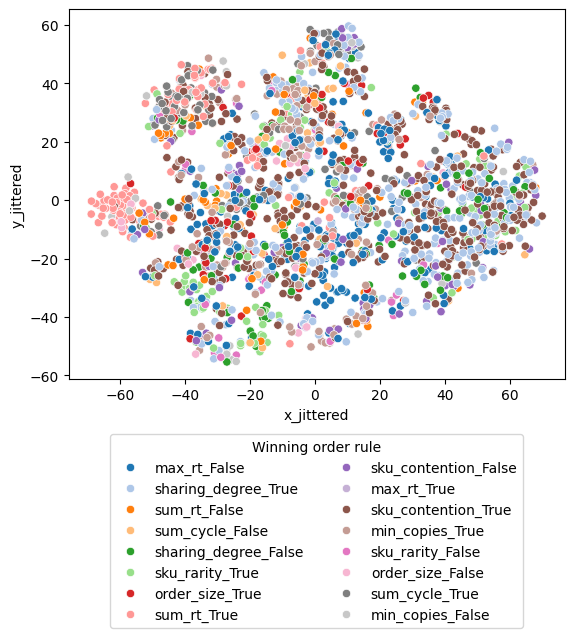

In [663]:
# Plot with colors based on Order Config
palette = sns.color_palette("husl", len(pd.unique(df2d["AMA_Combined_Order"])))

ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='AMA_Combined_Order',
    palette="tab20",
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=2,                  
    borderaxespad=0,
    title="Winning order rule"               
)

plt.savefig("order_attr_tsne.svg", format="svg", bbox_inches="tight")
plt.show()



16 out of 16


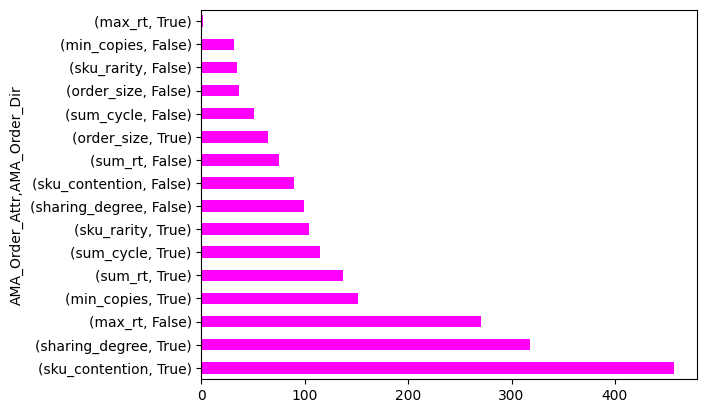

In [664]:
ordering_types_order = pd.unique(df["AMA_Order_Attr"])
counts_order = df.value_counts(subset=["AMA_Order_Attr", "AMA_Order_Dir"])
counts_order.plot(kind='barh',color='magenta')
print(f"{sum(1 for x in counts_order if x > 0)} out of {2*len(ordering_types_order)}")

12 out of 12


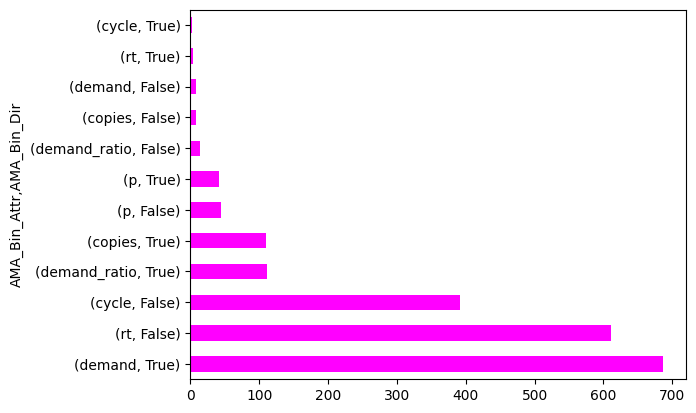

In [665]:
ordering_types_bin = pd.unique(df["AMA_Bin_Attr"])
counts_bin = df.value_counts(subset=["AMA_Bin_Attr", "AMA_Bin_Dir"])
counts_bin.plot(kind='barh',color='magenta')
print(f"{sum(1 for x in counts_bin if x > 0)} out of {2*len(ordering_types_bin)}")

<class 'pandas.core.frame.DataFrame'>
Index: 2035 entries, 0 to 2047
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AMA_Config_Str               2035 non-null   object 
 1   AMA_Config_Str_Reduced       2035 non-null   object 
 2   AMA_Combined_Order           2035 non-null   object 
 3   x_coord                      2035 non-null   float32
 4   y_coord                      2035 non-null   float32
 5   x_jittered                   2035 non-null   float64
 6   y_jittered                   2035 non-null   float64
 7   best_score_from_reduced_set  2035 non-null   float64
 8   best_score                   2035 non-null   float64
 9   baseline_score               2035 non-null   float64
 10  contentious_cv               2035 non-null   bool   
 11  score_cv                     2035 non-null   float64
 12  contentious_spread           2035 non-null   bool   
 13  score_spread           

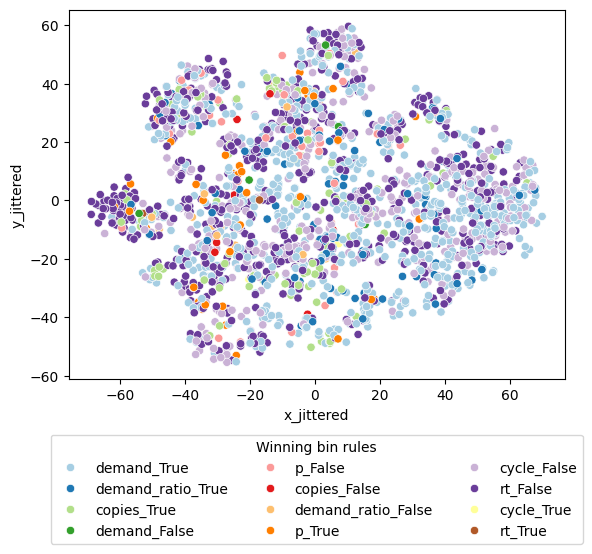

In [666]:

df2d["AMA_Combined_Bin"] = df["AMA_Bin_Attr"] + '_' + df["AMA_Bin_Dir"].astype(str)
palette = sns.color_palette("husl", len(pd.unique(df2d["AMA_Combined_Bin"])))
df2d.info()
ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='AMA_Combined_Bin',
    palette="Paired",
    legend='brief'
)

sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=3,                  
    borderaxespad=0,
    title="Winning bin rules"               
)
plt.savefig("bin_attr_tsne.svg", format="svg", bbox_inches="tight")
plt.show()


122 out of 192


/var/folders/r3/_sqxxd5n0bjd_f5bjc4w0dch0000gn/T/ipykernel_1642/597870939.py:2: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  counts = pd.value_counts(df["AMA_Config_Str"])


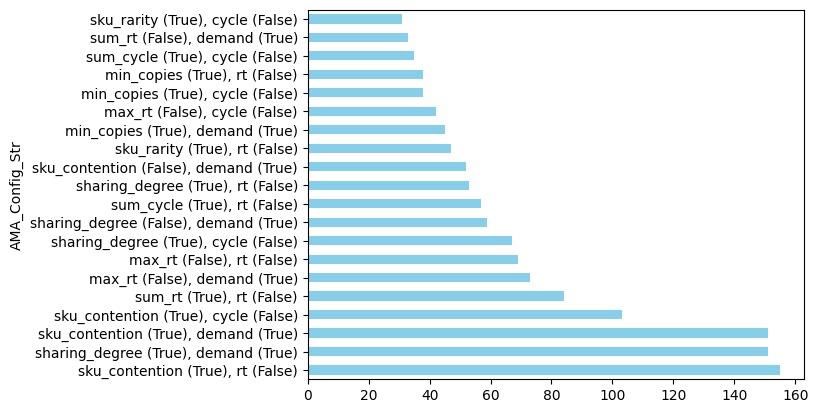

In [667]:
unique_winning_configs = pd.unique(df["AMA_Config_Str"])
counts = pd.value_counts(df["AMA_Config_Str"])
counts.head(20).plot(kind='barh',color='skyblue')
print(f"{len(unique_winning_configs)} out of {2*len(ordering_types_bin)*2*len(ordering_types_order)}")



<class 'pandas.core.frame.DataFrame'>
Index: 2035 entries, 0 to 2047
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   AMA_Config_Str               2035 non-null   object 
 1   AMA_Config_Str_Reduced       2035 non-null   object 
 2   AMA_Combined_Order           2035 non-null   object 
 3   x_coord                      2035 non-null   float32
 4   y_coord                      2035 non-null   float32
 5   x_jittered                   2035 non-null   float64
 6   y_jittered                   2035 non-null   float64
 7   best_score_from_reduced_set  2035 non-null   float64
 8   best_score                   2035 non-null   float64
 9   baseline_score               2035 non-null   float64
 10  contentious_cv               2035 non-null   bool   
 11  score_cv                     2035 non-null   float64
 12  contentious_spread           2035 non-null   bool   
 13  score_spread           

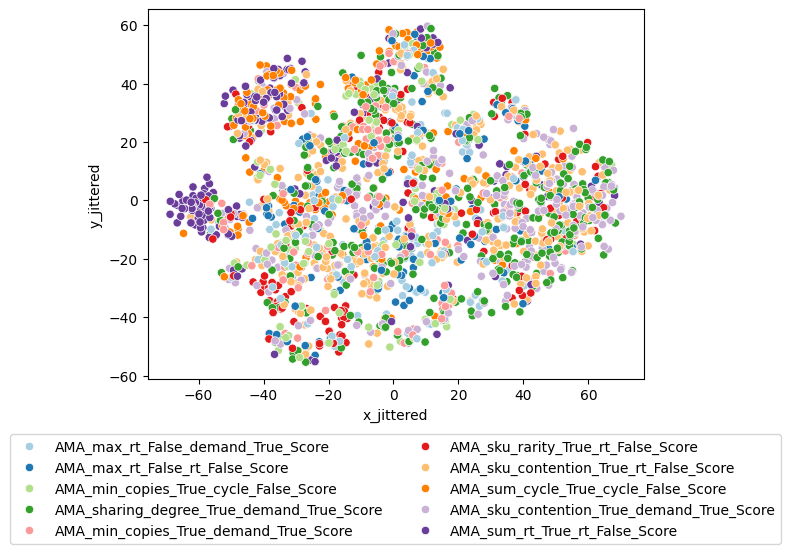

In [668]:

# palette = sns.color_palette("husl", len(pd.unique(df["AMA_Config_Str"])))
palette = "Paired"
df2d.info()
ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='AMA_Config_Str_Reduced',
    palette=palette,
    legend='brief'
)

sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=2,                  
    borderaxespad=0,
    title=None               
)
plt.show()

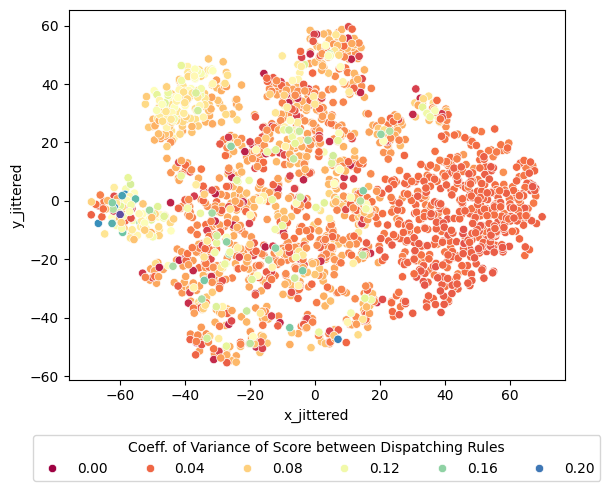

In [669]:
# Plot with colors based on score coeff of variation between al config

cv_mean = df2d.score_cv.mean()
cv_std = df2d.score_cv.std()
df2d_no_outliers_cv = df2d[(df2d["score_cv"] - cv_mean).abs() <= 2*cv_std]

ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='score_cv',
    palette='Spectral',
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title="Coeff. of Variance of Score between Dispatching Rules"             
)

plt.savefig("cv_tsne.svg", format="svg", bbox_inches="tight")
plt.show()


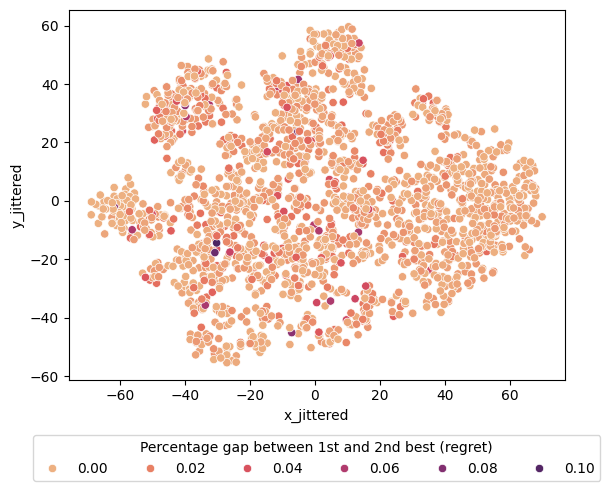

In [682]:
# Plot with colors based on gap between 1st and second winning conf


ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='regret_gap',
    palette='flare',
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title="Percentage gap between 1st and 2nd best (regret)"             
)

plt.savefig("regret_gap_tsne.svg", format="svg", bbox_inches="tight")
plt.show()


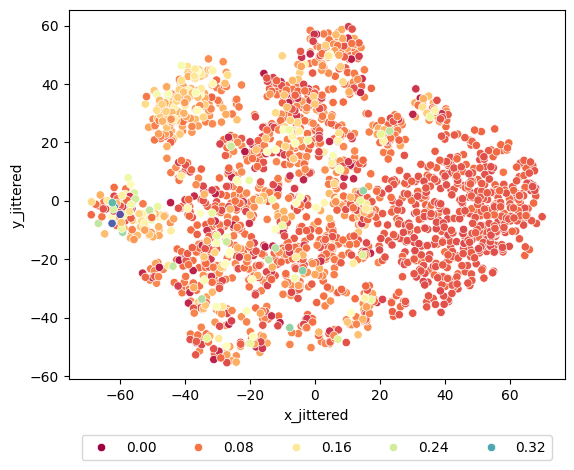

In [671]:
# Plot with colors based on score inter-quartile range between al config
palette = sns.color_palette("husl", len(pd.unique(df2d["AMA_Combined_Order"])))

# spread_mean = df2d.score_spread.mean()
# spread_std = df2d.score_spread.std()
# df2d_no_outliers_spread = df2d[(df2d["score_spread"] - spread_mean).abs() <= 2*spread_std]

ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='score_iqr',
    palette='Spectral',
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title=None               
)

plt.show()



Fold 0:
0.3555992141453831
Fold 1:
0.32023575638506874
Fold 2:
0.3320235756385069
Fold 3:
0.3543307086614173


/var/folders/r3/_sqxxd5n0bjd_f5bjc4w0dch0000gn/T/ipykernel_1642/4096325731.py:37: UserWarning: The palette list has more values (10) than needed (9), which may not be intended.
  ax = sns.scatterplot(


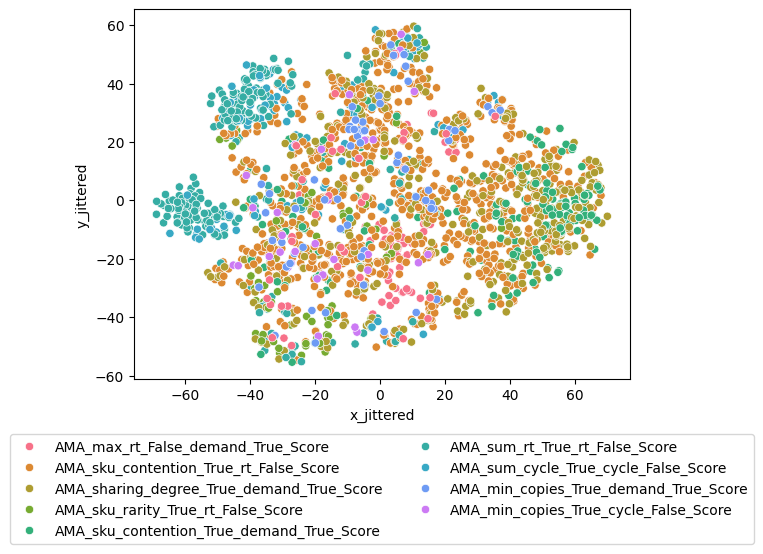

In [672]:
from sklearn import tree
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

# for whole configs
enc = LabelEncoder()

# Only use some features to interpret the tree better
skf = StratifiedKFold(n_splits=4, random_state=42, shuffle=True)
X = df[feature_cols]
y_str = df["AMA_Config_Str_Reduced"]
y = enc.fit_transform(y_str)
all_y_pred = np.zeros_like(y)
for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"Fold {i}:")
    # print(f"  Train: index={train_index}")
    # print(f"  Test:  index={test_index}")
    clf = tree.DecisionTreeClassifier(
        # class_weight="balanced", 
        max_depth=6,                # Limits the tree to 4 levels
        min_samples_leaf=32    # Prevents leaves with very few samples
    )
    train_X = X.iloc[train_index]
    test_X = X.iloc[test_index]
    train_y = y[train_index]
    test_y = y[test_index]

    clf.fit(train_X, train_y)
    pred_y = clf.predict(test_X)
    score = accuracy_score(test_y, pred_y)
    print(score)
    all_y_pred[test_index] = pred_y

palette = sns.color_palette("husl", len(pd.unique(df["AMA_Config_Str_Reduced"])))

ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue=enc.inverse_transform(all_y_pred),
    palette=palette,
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=2,                  
    borderaxespad=0,
    title=None               
)

plt.show()



In [673]:
import matplotlib.pyplot as plt
from sklearn import tree

clf = tree.DecisionTreeClassifier(
        # class_weight="balanced", 
        max_depth=6,                # Limits the tree to 4 levels
        min_samples_leaf=64,    # Prevents leaves with very few samples
    )
clf.fit(X, y)

plt.figure(figsize=(80, 20), dpi=300) 

tree.plot_tree(
    clf,
    feature_names=X.columns.tolist(),
    class_names=enc.classes_,
    filled=True,
    fontsize=10, 
    proportion=True,
    rounded=True,
    precision=5
)
print(X["feat_movecap_per_used_sku"].describe())
print((X["feat_movecap_per_used_sku"] == 0).sum())
plt.savefig("small_decision_tree.svg", format="svg", bbox_inches="tight")


count    2035.000000
mean        0.001598
std         0.001344
min         0.000075
25%         0.000706
50%         0.001307
75%         0.001852
max         0.009259
Name: feat_movecap_per_used_sku, dtype: float64
0


/Users/vojtech/Desktop/DP/Kolar-DP/code/.venv/lib/python3.10/site-packages/sklearn/model_selection/_split.py:811: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=16.
  warnings.warn(


Fold 0:
0.3984375
Fold 1:
0.4140625
Fold 2:
0.3515625
Fold 3:
0.4645669291338583
Fold 4:
0.4015748031496063
Fold 5:
0.3858267716535433
Fold 6:
0.4566929133858268
Fold 7:
0.3779527559055118
Fold 8:
0.36220472440944884
Fold 9:
0.3543307086614173
Fold 10:
0.4330708661417323
Fold 11:
0.44881889763779526
Fold 12:
0.33858267716535434
Fold 13:
0.41732283464566927
Fold 14:
0.4094488188976378
Fold 15:
0.3700787401574803


/var/folders/r3/_sqxxd5n0bjd_f5bjc4w0dch0000gn/T/ipykernel_1642/1284363351.py:35: UserWarning: The palette list has more values (16) than needed (15), which may not be intended.
  ax = sns.scatterplot(


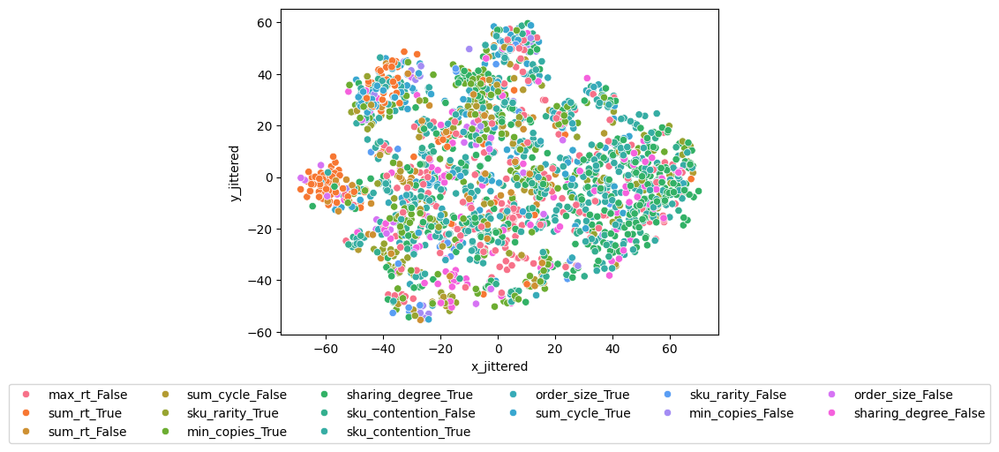

In [674]:
from sklearn import tree
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

# for just order configs
enc = LabelEncoder()

skf = StratifiedKFold(n_splits=16, random_state=42, shuffle=True)
df["AMA_Combined_Order"] = df["AMA_Order_Attr"] + '_' + df["AMA_Order_Dir"].astype(str)

X = df[feature_cols]
y_str = df["AMA_Combined_Order"]

y = enc.fit_transform(y_str)
all_y_pred = np.zeros_like(y)
for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"Fold {i}:")
    # print(f"  Train: index={train_index}")
    # print(f"  Test:  index={test_index}")
    clf = tree.DecisionTreeClassifier(class_weight="balanced")
    train_X = X.iloc[train_index]
    test_X = X.iloc[test_index]
    train_y = y[train_index]
    test_y = y[test_index]

    clf.fit(train_X, train_y)
    pred_y = clf.predict(test_X)
    score = accuracy_score(test_y, pred_y)
    print(score)
    all_y_pred[test_index] = pred_y

palette = sns.color_palette("husl", len(pd.unique(df2d["AMA_Combined_Order"])))

ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue=enc.inverse_transform(all_y_pred),
    palette=palette,
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title=None               
)

plt.show()



Fold 0:
0.4453125
Fold 1:
0.390625
Fold 2:


/Users/vojtech/Desktop/DP/Kolar-DP/code/.venv/lib/python3.10/site-packages/sklearn/model_selection/_split.py:811: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=16.
  warnings.warn(


0.375
Fold 3:
0.4251968503937008
Fold 4:
0.3858267716535433
Fold 5:
0.4094488188976378
Fold 6:
0.44881889763779526
Fold 7:
0.4645669291338583
Fold 8:
0.4015748031496063
Fold 9:
0.41732283464566927
Fold 10:
0.33858267716535434
Fold 11:
0.4094488188976378
Fold 12:
0.3779527559055118
Fold 13:
0.49606299212598426
Fold 14:
0.4015748031496063
Fold 15:
0.33858267716535434


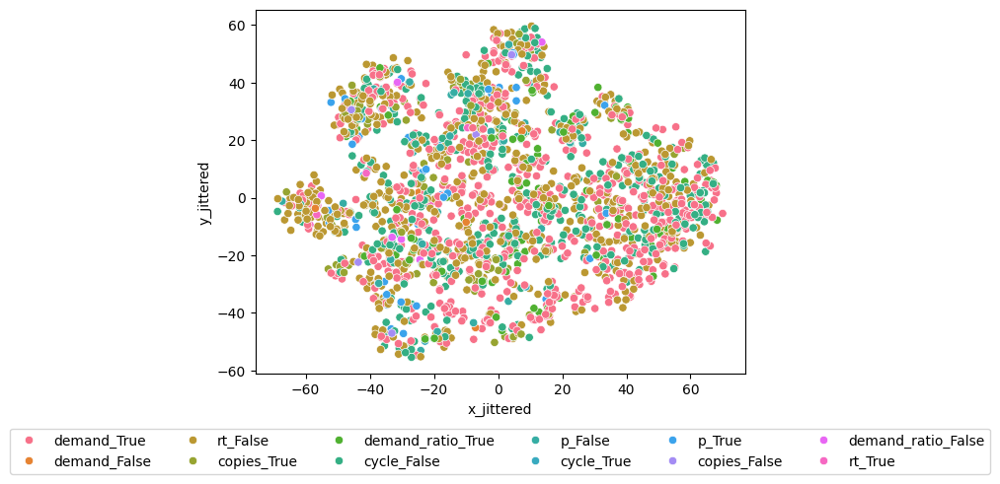

In [675]:
from sklearn import tree
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score

# for just order configs
enc = LabelEncoder()

skf = StratifiedKFold(n_splits=16, random_state=42, shuffle=True)
df["AMA_Combined_Bin"] = df["AMA_Bin_Attr"] + '_' + df["AMA_Bin_Dir"].astype(str)

X = df[feature_cols]
y_str = df["AMA_Combined_Bin"]

y = enc.fit_transform(y_str)
all_y_pred = np.zeros_like(y)
for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"Fold {i}:")
    # print(f"  Train: index={train_index}")
    # print(f"  Test:  index={test_index}")
    clf = tree.DecisionTreeClassifier(class_weight="balanced")
    train_X = X.iloc[train_index]
    test_X = X.iloc[test_index]
    train_y = y[train_index]
    test_y = y[test_index]

    clf.fit(train_X, train_y)
    pred_y = clf.predict(test_X)
    score = accuracy_score(test_y, pred_y)
    print(score)
    all_y_pred[test_index] = pred_y

palette = sns.color_palette("husl", len(pd.unique(df2d["AMA_Combined_Bin"])))

ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue=enc.inverse_transform(all_y_pred),
    palette=palette,
    legend='brief'
)


sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title=None               
)

plt.show()




Fold 0:
  Algorithm stopped early. Optimal number of trees: 138
  Accuracy: 0.4440
  Mean Gap to Best: 3.51%

Fold 1:
  Algorithm stopped early. Optimal number of trees: 101
  Accuracy: 0.3752
  Mean Gap to Best: 3.48%

Fold 2:
  Algorithm stopped early. Optimal number of trees: 123
  Accuracy: 0.4086
  Mean Gap to Best: 3.64%

Fold 3:
  Algorithm stopped early. Optimal number of trees: 154
  Accuracy: 0.4390
  Mean Gap to Best: 3.41%

Overall K-Fold Mean Gap to Best: 3.51%


/var/folders/r3/_sqxxd5n0bjd_f5bjc4w0dch0000gn/T/ipykernel_1642/2929511912.py:134: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


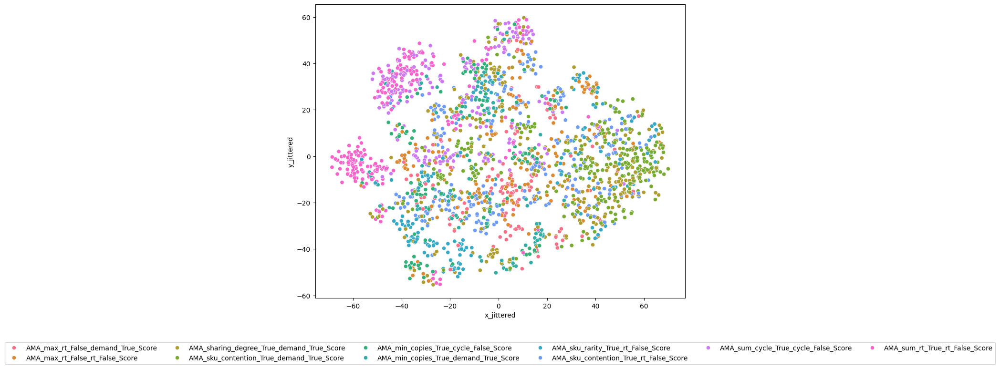

In [683]:
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.utils.class_weight import compute_sample_weight

target_col = "AMA_Config_Str_Reduced"
min_samples = 4

# 1. Find valid classes
counts = df[target_col].value_counts()
valid_classes = counts[counts >= min_samples].index

# 2. Create a boolean mask of the rows to keep
mask = df[target_col].isin(valid_classes)

# 3. Apply the mask to BOTH dataframes
df_filtered = df[mask].copy()
df2d_filtered = df2d[mask].copy() # Filter the plotting data

# Pre-calculate the absolute best makespan for each instance to use in the gap metric
df_filtered['true_best_makespan'] = df.loc[mask, "AMA_Best_Score"]

# 4. Reset indices to ensure StratifiedKFold, indexing, and plotting align cleanly
df_filtered.reset_index(drop=True, inplace=True)
df2d_filtered.reset_index(drop=True, inplace=True)

# 5. Re-assign X and y using the filtered dataframe
X = df_filtered[feature_cols]
y_str = df_filtered[target_col]

# Reset indices to ensure StratifiedKFold splits align cleanly
X.reset_index(drop=True, inplace=True)
y_str.reset_index(drop=True, inplace=True)

# Encode configuration strings to integers
enc = LabelEncoder()
y = enc.fit_transform(y_str)

skf = StratifiedKFold(n_splits=4, random_state=42, shuffle=True)

all_y_pred = np.zeros_like(y)
gap_scores = [] # Track the percentage gap for every test prediction

# Determine the number of unique classes for XGBoost configuration
num_classes = len(np.unique(y))

for i, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"\nFold {i}:")
    
    train_X = X.iloc[train_index]
    test_X = X.iloc[test_index]
    train_y = y[train_index]
    test_y = y[test_index]

    # Calculate sample weights to replace class_weight="balanced"
    sample_weights = compute_sample_weight(class_weight='balanced', y=train_y)

    # Initialize XGBoost
    clf = xgb.XGBClassifier(
        objective='multi:softmax', 
        num_class=num_classes,
        eval_metric='mlogloss',
        random_state=42,
        n_estimators=1000,
        learning_rate=0.05,
        max_depth=6,
        min_child_weight=10,
        colsample_bytree=0.7,
        subsample=0.8,
        early_stopping_rounds=50,
    )

    # Fit the model using the sample weights
    clf.fit(train_X, train_y, sample_weight=sample_weights, eval_set=[(test_X, test_y)], verbose=False)
    print(f"  Algorithm stopped early. Optimal number of trees: {clf.best_iteration}")
    
    pred_y = clf.predict(test_X)
    score = accuracy_score(test_y, pred_y)
    print(f"  Accuracy: {score:.4f}")
    
    # --- Mean Gap to Best Calculation ---
    # Decode the predicted numerical classes back to the actual rule names
    pred_rule_names = enc.inverse_transform(pred_y)
    fold_gaps = []
    
    for pos_i, global_idx in enumerate(test_index):
        pred_rule = pred_rule_names[pos_i]
        
        # Look up the true makespan of the rule the model predicted
        actual_makespan_of_pred = df_filtered.loc[global_idx, pred_rule]
        
        # Look up the mathematically absolute best makespan
        true_best_makespan = df_filtered.loc[global_idx, 'true_best_makespan']
        
        # Calculate % Gap
        gap_pct = (actual_makespan_of_pred - true_best_makespan) / true_best_makespan * 100.0
        fold_gaps.append(gap_pct)
        
    print(f"  Mean Gap to Best: {np.mean(fold_gaps):.2f}%")
    gap_scores.extend(fold_gaps)
    
    # Assign using test_index
    all_y_pred[test_index] = pred_y

print(f"\nOverall K-Fold Mean Gap to Best: {np.mean(gap_scores):.2f}%")

# --- Plotting ---
palette = sns.color_palette("husl", len(pd.unique(df_filtered[target_col])))

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(
    data=df2d_filtered, 
    x='x_jittered', 
    y='y_jittered', 
    hue=enc.inverse_transform(all_y_pred),
    palette=palette,
    legend='brief'
)

sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title=None               
)

plt.tight_layout()
plt.show()

In [677]:
def analyze_shap_and_select(clf, X, top_k, sample=None):
    import shap
    shap.initjs()
    if isinstance(sample, int):
        X = X.sample(n=sample, random_state=42)
        
    explainer = shap.TreeExplainer(clf)
    shap_values = explainer.shap_values(X)

    shap.summary_plot(shap_values, X, plot_type="bar", max_display=35)


    ## 1. Take absolute values so positive/negative impacts don't cancel out
    abs_shap_values = np.abs(shap_values)

    # 2. Sum the absolute impacts across all 35 classes (axis=2)
    # This collapses the array from (1695, 35, 35) down to (1695, 35)
    global_impact_per_sample = abs_shap_values.sum(axis=2)

    # 3. Average across all 1695 samples (axis=0) to get the final score per feature
    # This collapses the array from (1695, 35) down to a flat list of 35 scores
    final_feature_importance = global_impact_per_sample.mean(axis=0)

    # 4. Rank and select your K best features
    feature_ranking = np.argsort(final_feature_importance)[::-1]
    top_k_features = feature_ranking[:top_k] # Selecting the top k

    print(f"Global Top {top_k} Features: {top_k_features}")

    print("All feature names:", feature_cols)
    print("Selected features names:", [feature_cols[x] for x in top_k_features])

    # 5. Slice your dataset for your MLP
    X_train_mlp = X[[feature_cols[x] for x in top_k_features]]
    return X_train_mlp
# X_train_mlp = analyze_shap_and_select(clf, X, 27)


--- Fold 0 ---
Optimal number of trees: 782
Top-5 Overlap Accuracy: 0.7002

--- Fold 1 ---
Optimal number of trees: 521
Top-5 Overlap Accuracy: 0.6990

--- Fold 2 ---
Optimal number of trees: 12
Top-5 Overlap Accuracy: 0.6731

--- Fold 3 ---
Optimal number of trees: 26
Top-5 Overlap Accuracy: 0.6850

Overall K-Fold Top-5 Overlap Accuracy: 0.6893


/var/folders/r3/_sqxxd5n0bjd_f5bjc4w0dch0000gn/T/ipykernel_1642/147669059.py:152: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


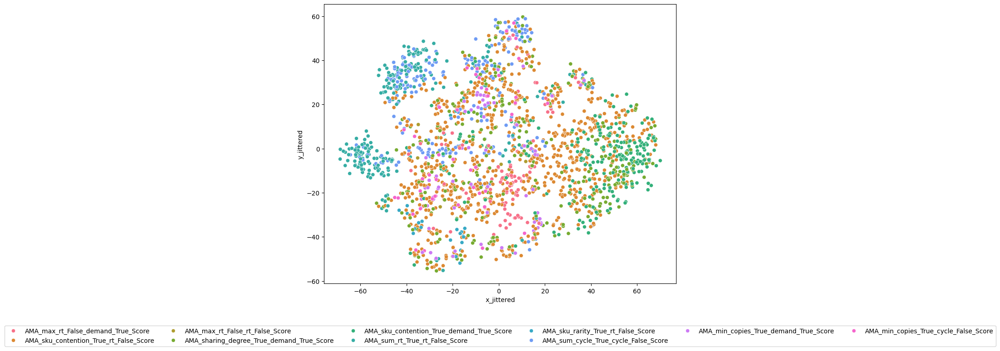

In [678]:
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder



# 2. Pre-calculate Ground Truth Top 5 for every instance
# We assume the values in all_ama_configs are makespans (lower is better)
# If they are already relevance scores (higher is better), change nsmallest to nlargest
df['gt_top5'] = df[all_ama_configs].apply(lambda row: row.nsmallest(5).index.tolist(), axis=1)

# We use standard KFold. StratifiedKFold no longer applies since we 
# are ranking 192 items per instance, not predicting a single discrete class.
kf = KFold(n_splits=4, random_state=42, shuffle=True)

# Arrays to store our predictions for plotting and analysis
all_y_pred_best = np.empty(len(df), dtype=object)
all_pred_top5 = np.empty(len(df), dtype=object)
overlap_scores = []

# Helper function to melt data dynamically for train/test splits
def prep_ranking_data(data_df):
    melted = data_df.melt(
        id_vars=['Sample_Index'] + feature_cols,
        value_vars=all_ama_configs,
        var_name='rule_id',
        value_name='makespan'
    )
    
    # XGBoost strictly requires data sorted by the group ID
    melted = melted.sort_values('Sample_Index').reset_index(drop=True)
    
    # 1. Rank the makespans per instance (lowest makespan = rank 1)
    melted['rule_rank'] = melted.groupby('Sample_Index')['makespan'].rank(method='min', ascending=True)
    
    # 2. Convert to Tiered Relevance:
    # Rank 1 -> Relevance 5
    # Rank 2 -> Relevance 4 ... Rank 5 -> Relevance 1
    # Ranks > 5 -> Relevance 0
    melted['relevance'] = (6 - melted['rule_rank']).clip(lower=0)
    
    # Category cast is required for tree_method='hist'
    melted['rule_id'] = melted['rule_id'].astype('category')
    
    X_rank = melted[feature_cols + ['rule_id']]
    y_rank = melted['relevance']
    groups = melted.groupby('Sample_Index').size().values
    
    return X_rank, y_rank, groups, melted

for i, (train_index, test_index) in enumerate(kf.split(df)):
    print(f"\n--- Fold {i} ---")
    
    train_df = df.iloc[train_index].copy()
    test_df = df.iloc[test_index].copy()
    
    # Transform wide data to long data
    X_train, y_train, groups_train, _ = prep_ranking_data(train_df)
    X_val, y_val, groups_val, melted_val = prep_ranking_data(test_df)
    
    # Initialize XGBRanker
    ranker = xgb.XGBRanker(
        objective='rank:ndcg', 
        eval_metric='ndcg@5',
        random_state=42,
        n_estimators=1000,
        learning_rate=0.05,
        max_depth=7,
        min_child_weight=10,
        colsample_bytree=0.7,
        subsample=0.8,
        early_stopping_rounds=50,
        enable_categorical=True,
        tree_method='hist'
    )

    # Fit using the eval set to trigger early stopping. 
    # Rankers require eval_group to know the boundaries of the validation queries.
    ranker.fit(
        X_train, y_train, 
        group=groups_train,
        eval_set=[(X_val, y_val)],
        eval_group=[groups_val],
        verbose=False
    )
    print(f"Optimal number of trees: {ranker.best_iteration}")
    
    # Predict relevance scores on the validation fold
    melted_val['pred_score'] = ranker.predict(X_val)
    
    # Sort predictions per instance to find the top 5 highest scored rules
    val_sorted = melted_val.sort_values(['Sample_Index', 'pred_score'], ascending=[True, False])
    
    # Group by instance_id and extract the list of the top 5 rule_ids
    top5_preds = val_sorted.groupby('Sample_Index').head(5).groupby('Sample_Index')['rule_id'].apply(list)
    
    fold_overlaps = []
    
    # Iterate through the positional test indices safely
    for pos_i, global_idx in enumerate(test_index):
        # Use .iloc on test_df to safely grab the row by its relative position in the fold
        inst_id = test_df.iloc[pos_i]['Sample_Index']
        gt_5 = test_df.iloc[pos_i]['gt_top5']
        
        # Now this lookup is guaranteed to work
        pred_5 = top5_preds[inst_id]
        
        # Overlap = Number of shared elements / 5
        overlap_acc = len(set(pred_5) & set(gt_5)) / 5.0
        fold_overlaps.append(overlap_acc)
        
        # Map the predictions back to the global arrays using the global positional index
        all_pred_top5[global_idx] = pred_5
        all_y_pred_best[global_idx] = pred_5[0]
        
    print(f"Top-5 Overlap Accuracy: {np.mean(fold_overlaps):.4f}")
    overlap_scores.extend(fold_overlaps)

print(f"\nOverall K-Fold Top-5 Overlap Accuracy: {np.mean(overlap_scores):.4f}")

# --- Plotting ---
# Map the newly predicted best rules directly into df2d
df2d['pred_best_rule'] = all_y_pred_best

# We dynamically generate the palette based only on rules the model actually predicted
unique_predictions = df2d['pred_best_rule'].unique()
palette = sns.color_palette("husl", len(unique_predictions))

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(
    data=df2d, 
    x='x_jittered', 
    y='y_jittered', 
    hue='pred_best_rule',
    palette=palette,
    legend='brief'
)

sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=6,                  
    borderaxespad=0,
    title=None               
)

plt.tight_layout()
plt.show()

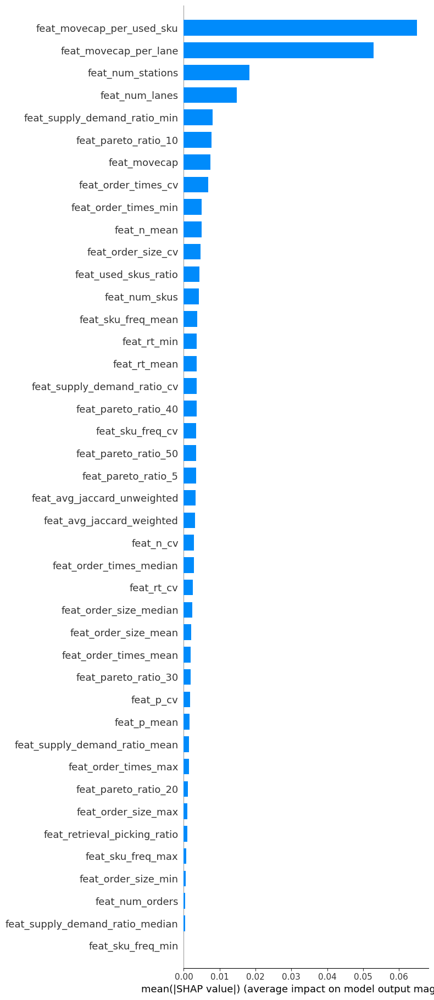

In [679]:
import shap

# 1. Pick a single instance ID from your validation set
# Let's say we want to analyze the first instance in the validation fold
target_instance_id = melted_val['Sample_Index'].iloc[0]

# 2. Extract the 192 rows corresponding to this single instance
instance_mask = melted_val['Sample_Index'] == target_instance_id
X_single_instance = X_val[instance_mask]
rules_for_instance = melted_val.loc[instance_mask, 'rule_id']

# 3. Initialize the SHAP TreeExplainer
explainer = shap.TreeExplainer(ranker)
# 1. Randomly sample 10,000 rows from your training or validation set
# X_sample = X_val.sample(n=2000, random_state=42)
X_sample = X_val
# 2. Calculate SHAP values for the sample
shap_values_global = explainer.shap_values(X_sample)
# 3. Plot the global feature importance
#shap.summary_plot(shap_values_global, X_sample, max_display=35, plot_type="bar")
shap.summary_plot(shap_values_global[:, :42], X_sample.drop("rule_id", axis=1), max_display=42, plot_type="bar")

In [684]:
# REGRESSOR XGB

import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, StratifiedKFold

target_col = "AMA_Config_Str"
n_splits = 4

# 1. Find valid classes
counts = df[target_col].value_counts()
valid_classes = counts[counts >= n_splits].index

# 2. Create a boolean mask of the rows to keep
mask = df[target_col].isin(valid_classes)

# 3. Apply the mask to BOTH dataframes
df_filtered = df[mask].copy()
df2d_filtered = df2d[mask].copy() # Filter the plotting data


# 1. Ensure instances have a unique ID
if 'instance_id' not in df.columns:
    df_filtered['instance_id'] = range(len(df_filtered))

# 2. Pre-calculate the absolute best makespan for each instance
# This is our ground truth baseline for calculating the "Gap to Best"
df_filtered['true_best_makespan'] = df["AMA_Best_Score"]

# kf = KFold(n_splits=8, random_state=42, shuffle=True)

# 1. Initialize StratifiedKFold instead of KFold
skf = StratifiedKFold(n_splits=n_splits, random_state=42, shuffle=True)


all_y_pred_best = np.empty(len(df_filtered), dtype=object)
gap_scores = []

# Helper to melt and normalize the data for regression
def prep_regression_data(data_df):
    melted = data_df.melt(
        id_vars=['instance_id'] + feature_cols,
        value_vars=all_ama_configs,
        var_name='rule_id',
        value_name='makespan'
    )
    
    melted['rule_id'] = melted['rule_id'].astype('category')
    
    # Normalize: Target = 1.0 for the best rule, > 1.0 for worse rules
    melted['instance_min'] = melted.groupby('instance_id')['makespan'].transform('min')
    melted['target'] = melted['makespan'] / melted['instance_min']
    
    X_reg = melted[feature_cols + ['rule_id']]
    y_reg = melted['target']
    
    return X_reg, y_reg, melted


# 2. Pass the winning rule column as 'y' purely to guide the stratification
for i, (train_index, test_index) in enumerate(skf.split(X=df_filtered, y=df_filtered['AMA_Config_Str'])):
# for i, (train_index, test_index) in enumerate(kf.split(df_filtered)):
    print(f"\n--- Fold {i} ---")
    
    train_df = df_filtered.iloc[train_index].copy()
    test_df = df_filtered.iloc[test_index].copy()
    
    X_train, y_train, _ = prep_regression_data(train_df)
    X_val, y_val, melted_val = prep_regression_data(test_df)
    
    # Initialize XGBRegressor instead of XGBRanker
    regressor = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=16, 
        min_child_weight=4,
        colsample_bytree=0.9,
        subsample=0.9,
        early_stopping_rounds=100,
        eval_metric='rmse',         # Use Root Mean Squared Error
        enable_categorical=True,
        tree_method='hist',
        random_state=42
    )

    # Fit using standard eval_set (no eval_group needed for regression)
    regressor.fit(
        X_train, y_train, 
        eval_set=[(X_val, y_val)],
        verbose=False
    )
    print(f"Optimal number of trees: {regressor.best_iteration}")
    
    # Predict the normalized makespan ratio
    melted_val['pred_target'] = regressor.predict(X_val)
    
    # Sort so the LOWEST predicted target is first (lower makespan is better)
    val_sorted = melted_val.sort_values(['instance_id', 'pred_target'], ascending=[True, True])
    
    # Grab the top predicted rule for each instance
    best_preds = val_sorted.groupby('instance_id').first()
    
    fold_gaps = []
    
    for pos_i, global_idx in enumerate(test_index):
        inst_id = test_df.iloc[pos_i]['instance_id']
        
        # 1. Which rule did the model think was best?
        pred_best_rule = best_preds.loc[inst_id, 'rule_id']
        
        # 2. What was the TRUE makespan of that predicted rule?
        actual_makespan_of_pred = test_df.iloc[pos_i][pred_best_rule]
        
        # 3. What was the mathematically absolute best makespan?
        true_best_makespan = test_df.iloc[pos_i]['true_best_makespan']
        
        # 4. Calculate % Gap: (Predicted_Makespan - Best_Makespan) / Best_Makespan
        gap_pct = (actual_makespan_of_pred - true_best_makespan) / true_best_makespan * 100.0
        fold_gaps.append(gap_pct)
        
        all_y_pred_best[global_idx] = pred_best_rule
        
    print(f"Mean Gap to Best: {np.mean(fold_gaps):.2f}%")
    gap_scores.extend(fold_gaps)

print(f"\nOverall K-Fold Mean Gap to Best: {np.mean(gap_scores):.2f}%")
print(f"Just using Baseline yields gap: {df2d_filtered['baseline_gap'].mean()*100:.2f}%")
print(f"Just the single best rule: {results[0][0]*100:.2f}%")
print(f"Trying out the three top rules: {results[2][0]*100:.2f}%")
# --- Plotting ---



--- Fold 0 ---
Optimal number of trees: 165
Mean Gap to Best: 2.83%

--- Fold 1 ---
Optimal number of trees: 113
Mean Gap to Best: 2.72%

--- Fold 2 ---
Optimal number of trees: 109
Mean Gap to Best: 3.04%

--- Fold 3 ---
Optimal number of trees: 159
Mean Gap to Best: 2.52%

Overall K-Fold Mean Gap to Best: 2.78%
Just using Baseline yields gap: 10.61%
Just the single best rule: 5.99%
Trying out the three top rules: 2.76%


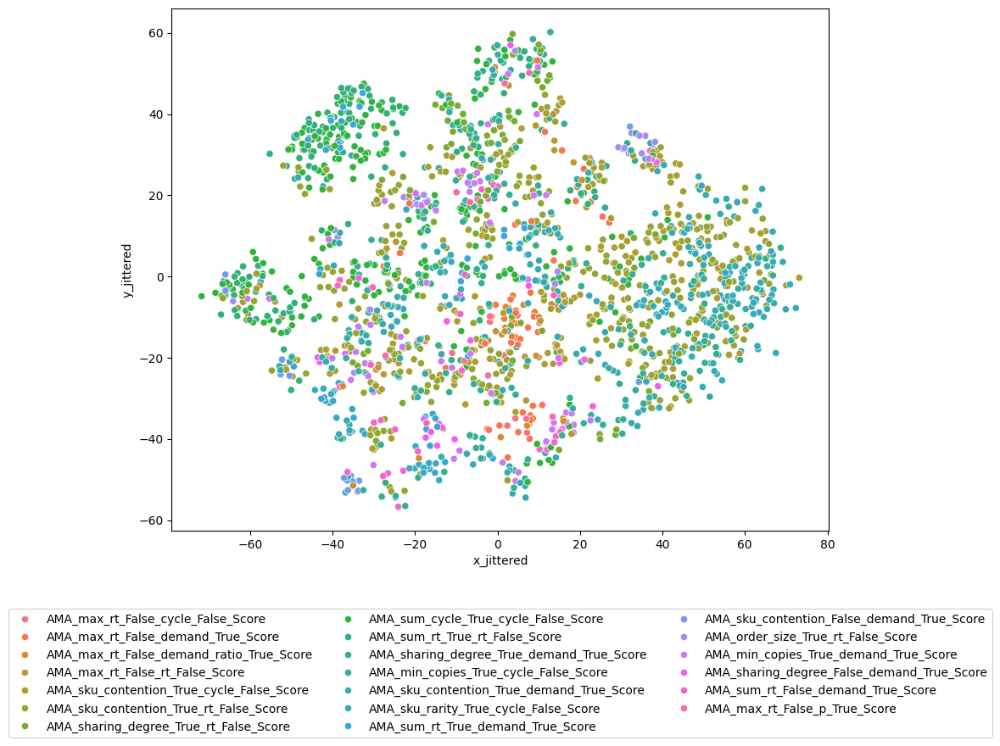

In [ ]:
df2d_filtered['pred_best_rule'] = all_y_pred_best

unique_predictions = df2d_filtered['pred_best_rule'].unique()
palette = sns.color_palette("husl", len(unique_predictions))

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(
    data=df2d_filtered, 
    x='x_jittered', 
    y='y_jittered', 
    hue='pred_best_rule',
    palette=palette,
    legend='brief'
)

sns.move_legend(
    ax, 
    loc="upper center",    
    bbox_to_anchor=(0.5, -0.15), 
    ncol=3,                  
    borderaxespad=0,
    title=None               
)

# plt.tight_layout()
plt.show()

In [ ]:
# X_train_mlp = analyze_shap_and_select(regressor, X_val, 27, sample=10000)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

class MultiHeadMLP(nn.Module):
    def __init__(self, input_dim=27, num_outputs=192):
        super().__init__()
        # Shared feature extractor (backbone)
        h = 4
        self.shared_backbone = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(input_dim, h),
            nn.ReLU(),
        )
        
        # Unique predictors for each configuration output
        # nn.ModuleList is crucial so PyTorch registers these submodules!
        self.heads = nn.ModuleList([
            nn.Linear(h, 1) for _ in range(num_outputs)
        ])

    def forward(self, x):
        shared_features = self.shared_backbone(x)
        # Pass the shared representation through each individual head
        outputs = [head(shared_features) for head in self.heads]
        # Concatenate outputs along the column dimension -> shape: [batch_size, num_outputs]
        return torch.cat(outputs, dim=1)

    
class MultiScoreDataset(Dataset):
    def __init__(self, features, scores, top_score):
        self.features = features
        self.scores = scores
        self.top_score = top_score

    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, index):
        ft = torch.tensor(self.features.iloc[index].to_numpy(), dtype=torch.float32)
        norm_scores = torch.tensor(self.scores.iloc[index].to_numpy(), dtype=torch.float32) / self.top_score.iloc[index]
        return ft, norm_scores

# full_dataset = MultiScoreDataset(df[feature_cols], df[all_ama_configs], df["AMA_Best_Score"])
# Use feature selected dataset from xgboost to allow bigger hidden dim
full_dataset = MultiScoreDataset(X_train_mlp, df[all_ama_configs], df["AMA_Best_Score"])
device = torch.device("mps")                
train_dataset, test_dataset = torch.utils.data.random_split(full_dataset, [0.8, 0.2])
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=True)
epochs = 1000
criterion = nn.L1Loss()
model = MultiHeadMLP().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

def get_mean_gap_to_best(model, test_dataloader):
    model.eval()
    
    total_gap = 0.0
    total_samples = 0
    
    with torch.inference_mode():
        for X_batch, y_batch in test_dataloader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            
            # Model predicts the normalized scores
            outputs = model(X_batch)
            
            # 1. Which rule did the model think was best? (Lowest predicted ratio)
            pred_winners = torch.argmin(outputs, dim=1) 
            
            # 2. What was the TRUE normalized score of the rule it picked?
            batch_indices = torch.arange(y_batch.size(0))
            actual_scores_of_preds = y_batch[batch_indices, pred_winners]
            
            # 3. Calculate % Gap
            # Since y_batch is already (makespan / best_makespan), the best is exactly 1.0
            gap_pct = (actual_scores_of_preds - 1.0) * 100.0
            
            # Accumulate the sum of gaps for this batch
            total_gap += gap_pct.sum().item()
            total_samples += y_batch.size(0) 

    # Return the mean gap across all instances
    return total_gap / total_samples


# --- Updated Training Loop ---
model.train()
for epoch in range(epochs):
    total_loss = 0.0
    for X_batch, y_batch in train_dataloader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device) 
        
        optimizer.zero_grad()
        
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch) 
        
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        
    if (epoch + 1) % 10 == 0:
        mean_gap = get_mean_gap_to_best(model, test_dataloader)
        print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(train_dataloader):.4f}")
        print(f"Validation Mean Gap to Best: {mean_gap:.2f}%")
        model.train()

NameError: name 'X_train_mlp' is not defined